# Importing Libs

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.dates import MonthLocator, DateFormatter
import tensorflow as tf
from tensorflow import keras
from sklearn.preprocessing import StandardScaler
from keras.layers import Input, Dense
from keras.models import Model
from sklearn.metrics import precision_recall_fscore_support
from tensorflow.keras.layers import Dropout
from tensorflow.keras.regularizers import l2
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, TensorBoard
from sklearn.model_selection import GridSearchCV, ParameterGrid
from scikeras.wrappers import KerasRegressor
from tensorboard.plugins.hparams import api as hp
from datetime import datetime
import warnings
from tensorflow import get_logger
get_logger().setLevel('ERROR')
warnings.filterwarnings("ignore", message="Setting the random state for TF")

In [2]:
# Set a random seed for reproducibility
np.random.seed(0)
tf.random.set_seed(0)

# importing data

In [3]:
# Load the Excel file
path = 'Data/'
xls = pd.ExcelFile(path + 'ActiveCustomer.xlsx')

# Create an empty DataFrame to store the combined data
combined_df = pd.DataFrame()

# Initialize variables for start and end dates
start_date = None
end_date = None

# Loop through each sheet in the Excel file
for sheet_name in xls.sheet_names:
    # Read the sheet into a DataFrame
    sheet_df = pd.read_excel(xls, sheet_name=sheet_name)
    
    # Find the minimum and maximum dates in the current sheet
    min_date = sheet_df['Date'].min()
    max_date = sheet_df['Date'].max()
    
    # Update start_date and end_date if necessary
    if start_date is None or min_date < start_date:
        start_date = min_date
    if end_date is None or max_date > end_date:
        end_date = max_date
    
    # Set the date column as the index
    sheet_df.set_index('Date', inplace=True)
    
    # Add the data to the combined DataFrame
    combined_df = combined_df.add(sheet_df, fill_value=0)

# Generate a date range covering the determined period
date_range = pd.date_range(start=start_date, end=end_date)

# Set the date range as the index for the combined DataFrame
combined_df['Date'] = date_range
combined_df.set_index('Date', inplace=True)

# Reset the index to have the 'Date' column as a regular column
combined_df.reset_index(inplace=True)

# Filling the NaN values with zero as they do not exist in the database
df = combined_df.fillna(value = 0)

# Change the data type of columns with int values to int
df.iloc[: , 1:] = df.iloc[: , 1:].astype(int)
df['ClosedDeals'] = df.DealsFailed + df.DealsSucceeded
df.drop(columns = ['DealsFailed' , 'DealsSucceeded'] , inplace=True)

In [4]:
# removin ghte last record
df = df.head(df.shape[0]-1)
df.head()

,Date,ActiveCustomer,Churned,DealsAdded,Leads,NewPaid,ClosedDeals
0,2022-03-21,1183,0,3565,19,1,1196
1,2022-03-22,1097,2,774,20,1,478
2,2022-03-23,946,0,997,12,1,458
3,2022-03-24,918,0,590,19,0,370
4,2022-03-25,857,5,498,17,0,282


# Visualizing the features

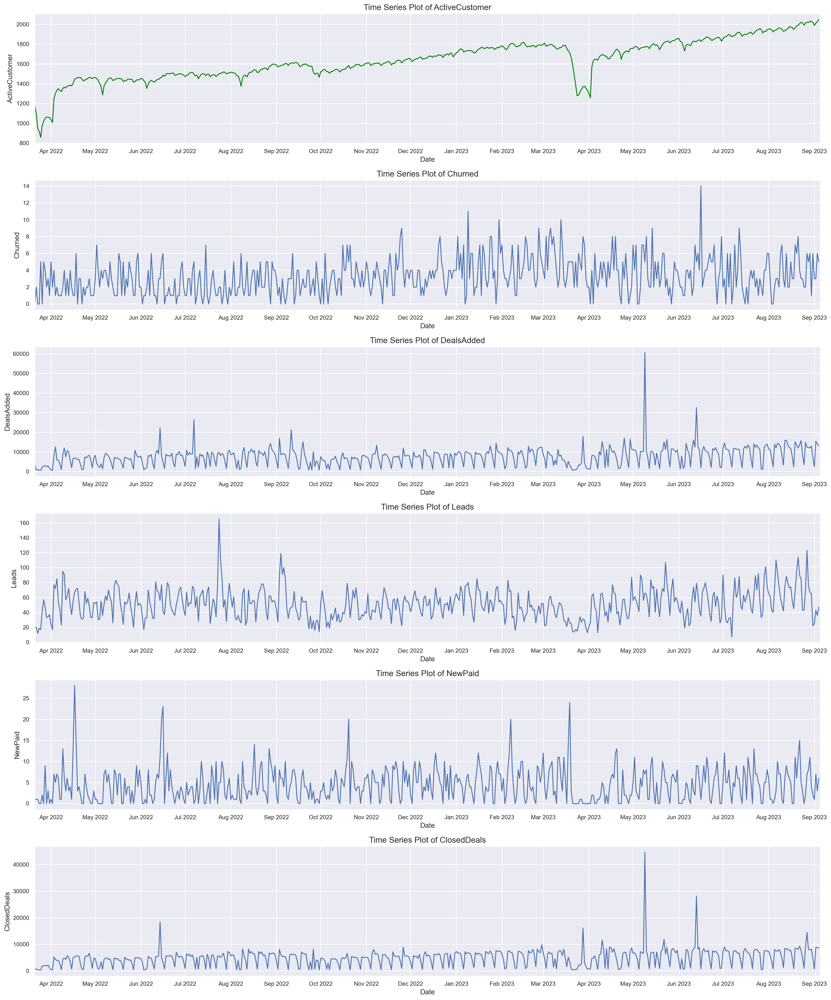

In [5]:
features = df.columns.drop('Date')

sns.set_theme()

# Create subplots for each feature
fig, axes = plt.subplots(len(features), 1, figsize=(20, 4*len(features)) , dpi=200)

# Iterate through each feature and plot it
for i, feature in enumerate(features):
    if feature == 'ActiveCustomer':
        # Set the color to red for the 'ActiveCustomer' feature
        sns.lineplot(data=df, x='Date', y=feature, ax=axes[i], color='green')
    else:
        sns.lineplot(data=df, x='Date', y=feature, ax=axes[i])
    axes[i].set_title(f'Time Series Plot of {feature}', fontsize=14)
    axes[i].set_xlabel('Date', fontsize=12)
    axes[i].set_ylabel(feature, fontsize=12)
    axes[i].tick_params(axis='both', labelsize=10)
    axes[i].set_xlim([start_date , end_date])
    # Set custom date locator for x-axis to show every month
    axes[i].xaxis.set_major_locator(MonthLocator(interval=1))
    axes[i].xaxis.set_major_formatter(DateFormatter('%b %Y'))  # Format the month and year
    
# Adjust subplot layout for better readability
plt.tight_layout()

# Show the plots
plt.show()

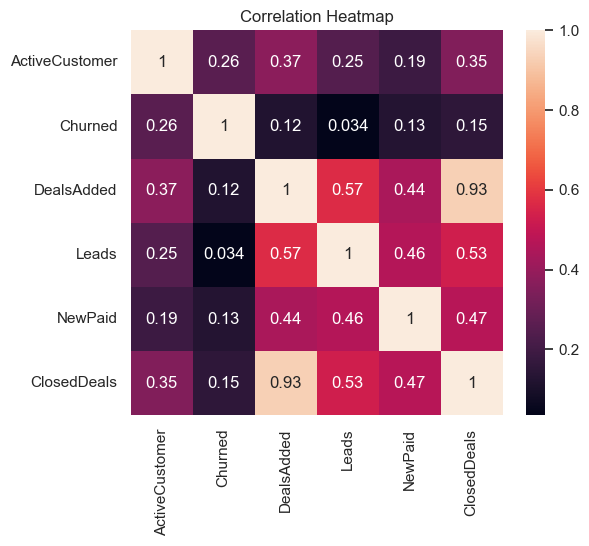

In [6]:
# Correlation Heatmap
plt.figure(figsize=(6, 5))
sns.heatmap(df.drop('Date', axis=1).corr(), annot=True, cbar=True)
plt.title("Correlation Heatmap")
plt.show()

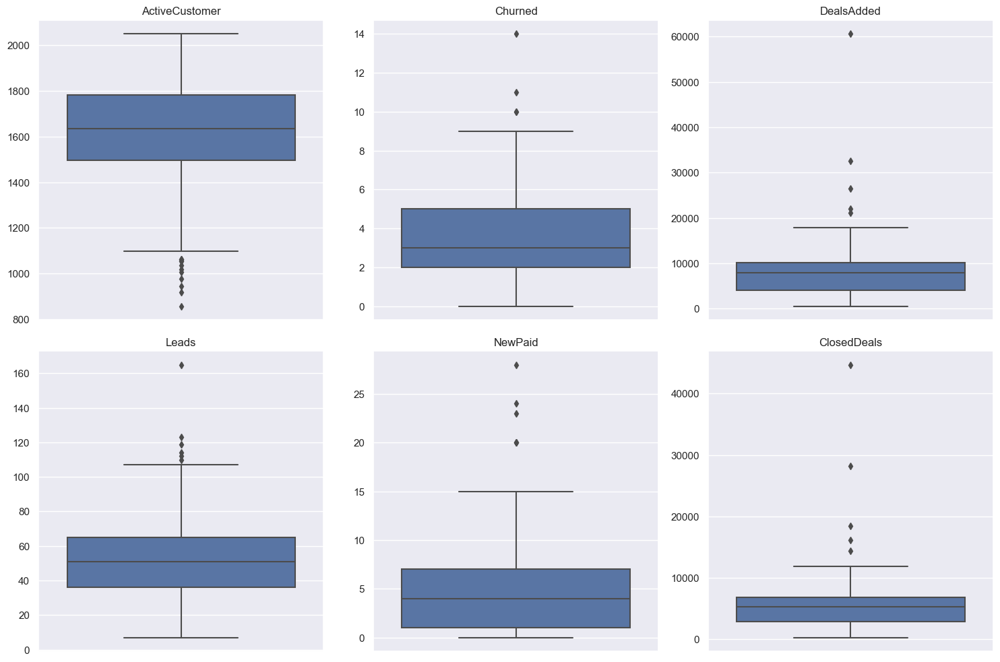

In [7]:
num_cols_per_row = 3  # Number of box plots per row
num_rows = (len(features) - 1) // num_cols_per_row + 1

plt.figure(figsize=(15, num_rows * 5))

for i, column in enumerate(features):
    plt.subplot(num_rows, num_cols_per_row, i + 1)
    sns.boxplot(y=df[column])
    plt.title(f"{column}")
    plt.ylabel('')

plt.tight_layout()
plt.show()

## Identifying the outliers using Autoencoders

In this section, autoencoders were employed to detect outliers. To clarify further, we utilized the best hyperparameters obtained through grid search.

To perform hyperparamter tuning, you can add values to `dropout_rate`, `batch_size` & `epochs`. **DO NOT** values of `encoding_dim` as we have only one input series.

Example of modifications:
```
# Define the hyperparameters to search
param_grid = {
    'encoding_dim': [1],
    'dropout_rate': [0.05, 0.1, 0.15, 0.2 , 0.3],
    'batch_size': [16, 32, 48, 64, 128],
    'epochs': [200, 500]
}
```

In [8]:
# Define the hyperparameters to search
param_grid = {
    'encoding_dim': [1],
    'dropout_rate': [0.05, 0.1, 0.15, 0.2],
    'batch_size': [16, 32, 48, 64],
    'epochs': [200]
}

In [9]:
# Function to create and train an autoencoder
def create_autoencoder(input_dim, encoding_dim=1, dropout_rate=0.2):
    input_layer = tf.keras.Input(shape=(input_dim,))
    encoded = tf.keras.layers.Dense(encoding_dim, activation='relu', kernel_regularizer=l2(0.001))(input_layer)
    dropout_encoded = Dropout(dropout_rate)(encoded)
    decoded = tf.keras.layers.Dense(input_dim, activation='linear')(dropout_encoded)

    autoencoder = tf.keras.Model(input_layer, decoded)

    autoencoder.compile(optimizer='adam', loss='mean_squared_error')

    return autoencoder

# Function to train the autoencoder with given hyperparameters
def train_autoencoder(autoencoder, feature_data, epochs=100, batch_size=30):
    scaler = StandardScaler()
    scaled_data = scaler.fit_transform(feature_data)

    early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
    reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=5, min_lr=0.0001)

    autoencoder.fit(scaled_data, scaled_data, epochs=epochs, batch_size=batch_size, shuffle=False, validation_split=0.3, callbacks=[early_stopping, reduce_lr])

    reconstructed_data = autoencoder.predict(scaled_data)
    reconstruction_error = np.square(scaled_data - reconstructed_data)

    return reconstruction_error

features_to_detect_outliers = df.drop(columns=['Date', 'ActiveCustomer']).columns

reconstruction_error_dic = {}

# Perform hyperparameter search
for feature_name in features_to_detect_outliers:
    feature_data = df[[feature_name]]  # Select the specific feature

    best_error = None
    best_params = None

    for params in ParameterGrid(param_grid):
        autoencoder = create_autoencoder(feature_data.shape[1], encoding_dim=params['encoding_dim'], dropout_rate=params['dropout_rate'])
        reconstruction_error = train_autoencoder(autoencoder, feature_data, epochs=params['epochs'], batch_size=params['batch_size'])

        if best_error is None or np.mean(reconstruction_error) < best_error:
            best_error = np.mean(reconstruction_error)
            best_params = params

    # Train the autoencoder with the best hyperparameters
    autoencoder = create_autoencoder(feature_data.shape[1], encoding_dim=best_params['encoding_dim'], dropout_rate=best_params['dropout_rate'])
    reconstruction_error = train_autoencoder(autoencoder, feature_data, epochs=best_params['epochs'], batch_size=best_params['batch_size'])

    reconstruction_error_dic[feature_name] = reconstruction_error

Epoch 1/200
24/24 [==============================] - 1s 7ms/step - loss: 1.0670 - val_loss: 1.2144 - lr: 0.0010
Epoch 2/200
24/24 [==============================] - 0s 2ms/step - loss: 1.0458 - val_loss: 1.2021 - lr: 0.0010
Epoch 3/200
24/24 [==============================] - 0s 2ms/step - loss: 1.0276 - val_loss: 1.1912 - lr: 0.0010
Epoch 4/200
24/24 [==============================] - 0s 2ms/step - loss: 1.0119 - val_loss: 1.1818 - lr: 0.0010
Epoch 5/200
24/24 [==============================] - 0s 2ms/step - loss: 1.0009 - val_loss: 1.1735 - lr: 0.0010
Epoch 6/200
24/24 [==============================] - 0s 2ms/step - loss: 0.9879 - val_loss: 1.1664 - lr: 0.0010
Epoch 7/200
24/24 [==============================] - 0s 2ms/step - loss: 0.9783 - val_loss: 1.1604 - lr: 0.0010
Epoch 8/200
24/24 [==============================] - 0s 2ms/step - loss: 0.9713 - val_loss: 1.1547 - lr: 0.0010
Epoch 9/200
24/24 [==============================] - 0s 2ms/step - loss: 0.9635 - val_loss: 1.1497 - lr:

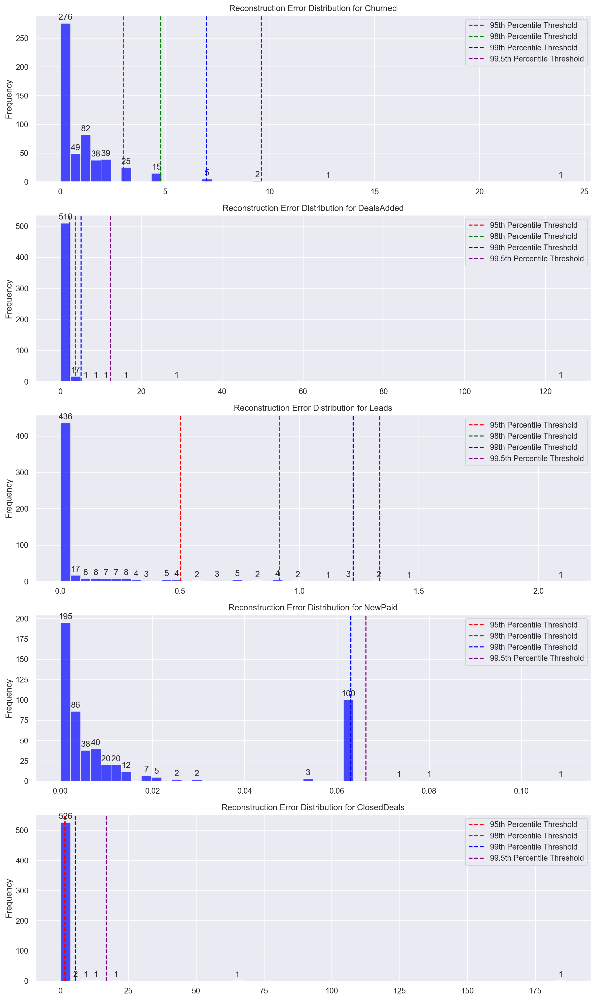

In [10]:
# Create subplots for the histograms of reconstruction errors
num_cols = len(features_to_detect_outliers)
fig, axes = plt.subplots(num_cols, 1, figsize=(12, 4 * num_cols) , dpi=200)

# Define the percentiles for the thresholds and corresponding colors
threshold_percentiles = [95, 98, 99, 99.5]
threshold_colors = ['red', 'green', 'blue', 'purple']

# Loop through each feature and plot its reconstruction error histogram
for i, column in enumerate(features_to_detect_outliers):
    ax = axes[i]

    # Flatten the reconstruction errors to a 1D array for plotting
    errors = reconstruction_error_dic[column].flatten()

    # Plot the histogram of reconstruction errors
    n, bins, patches = ax.hist(errors, bins=50, color='blue', alpha=0.7)
    ax.set_title(f'Reconstruction Error Distribution for {column}', fontsize=12)
    ax.set_ylabel('Frequency')

    # Calculate and draw threshold lines for the specified percentiles with corresponding colors
    for percentile, color in zip(threshold_percentiles, threshold_colors):
        threshold = np.percentile(errors, percentile)
        ax.axvline(x=threshold, color=color, linestyle='--', label=f'{percentile}th Percentile Threshold')
    
    ax.legend()

    # Add the number of occurrences on top of each bar
    for count, rect in zip(n, patches):
        if count > 0:
            ax.annotate(str(int(count)), (rect.get_x() + rect.get_width() / 2, count), xytext=(0, 5), textcoords='offset points', ha='center')

plt.tight_layout()
plt.show()

In [11]:
# Define the desired percentile threshold (99th percentile)
desired_percentile = 99.0

In [12]:
# Initialize a dictionary to store outlier indices for each feature
outlier_indices_dic = {}

# Loop through each feature and its corresponding reconstruction errors
for feature_name, errors in reconstruction_error_dic.items():
    # Calculate the percentile threshold for this feature
    threshold = np.percentile(errors, desired_percentile)
    
    # Create a boolean mask to identify outliers
    is_outlier = errors > threshold
    
    # Find the indices of outliers
    outlier_indices = np.where(is_outlier)[0]
    
    # Store the outlier indices in the dictionary
    outlier_indices_dic[feature_name] = outlier_indices

## Demonstrating Outliers

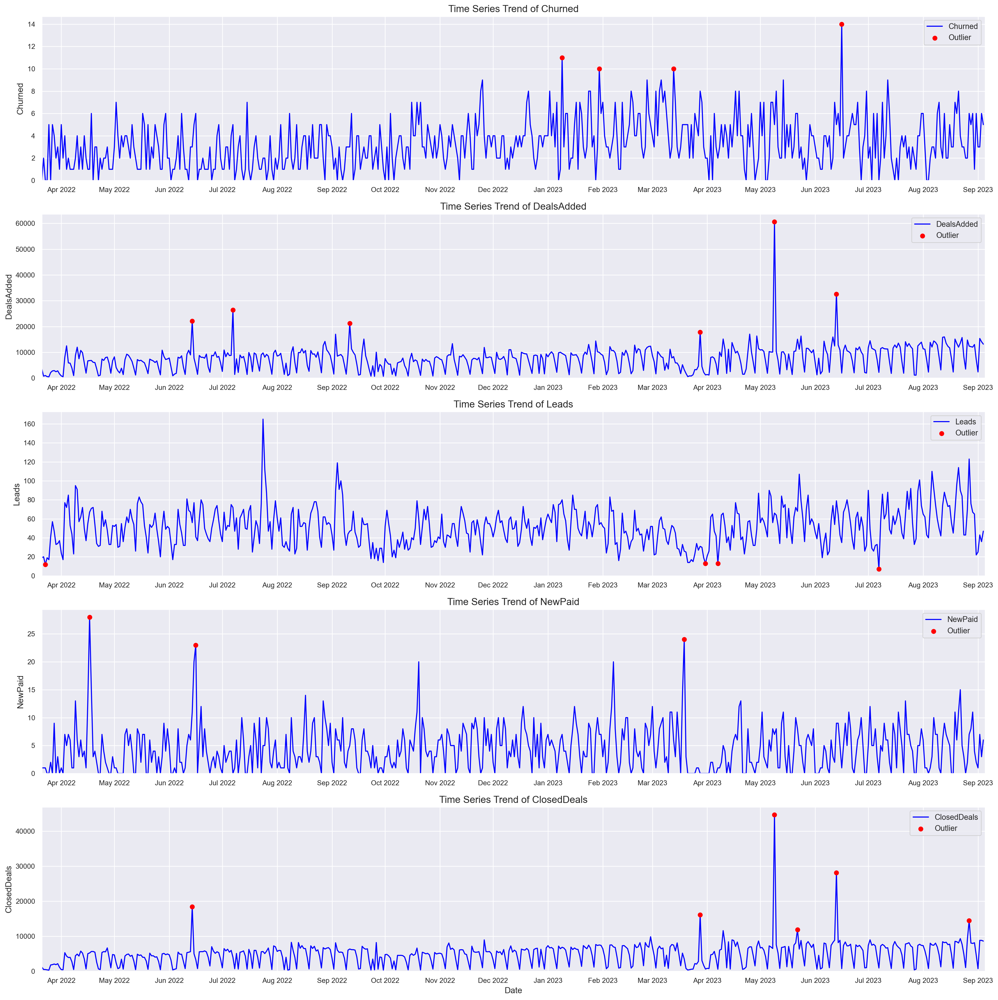

In [13]:
fig, axes = plt.subplots(len(features_to_detect_outliers), 1, figsize=(20, 4*len(features_to_detect_outliers)) , dpi=200)

# Loop through each column and plot its time series
for i, column in enumerate(features_to_detect_outliers):
    ax = axes[i]

    # Plot the entire time series
    ax.plot(df['Date'], df[column], label=column, color='blue')

    # Highlight the specified indices
    highlighted_values = df[column][outlier_indices_dic[column]]
    ax.scatter(df['Date'][outlier_indices_dic[column]], highlighted_values, color='red', label='Outlier', zorder=5)

    # Customize the subplot
    ax.set_ylabel(column)
    ax.set_title(f'Time Series Trend of {column}', fontsize=14)
    ax.tick_params(axis='both', labelsize=10)
    ax.set_xlim([start_date , end_date])
    ax.set_ylim(0)
    ax.legend()
    ax.xaxis.set_major_locator(MonthLocator(interval=1))
    ax.xaxis.set_major_formatter(DateFormatter('%b %Y'))  # Format the month and year

# Add a common x-axis label
axes[-1].set_xlabel('Date')

plt.tight_layout()
plt.show()

## Linear Imputation of the outliers

In [14]:
from copy import deepcopy
df_without_outlier = deepcopy(df)

for col in features_to_detect_outliers:
    df_without_outlier.loc[outlier_indices_dic[col] , col] = np.nan
    df_without_outlier.loc[: , col] = df_without_outlier.loc[: , col].interpolate(method='polynomial', order=2)

Modified df

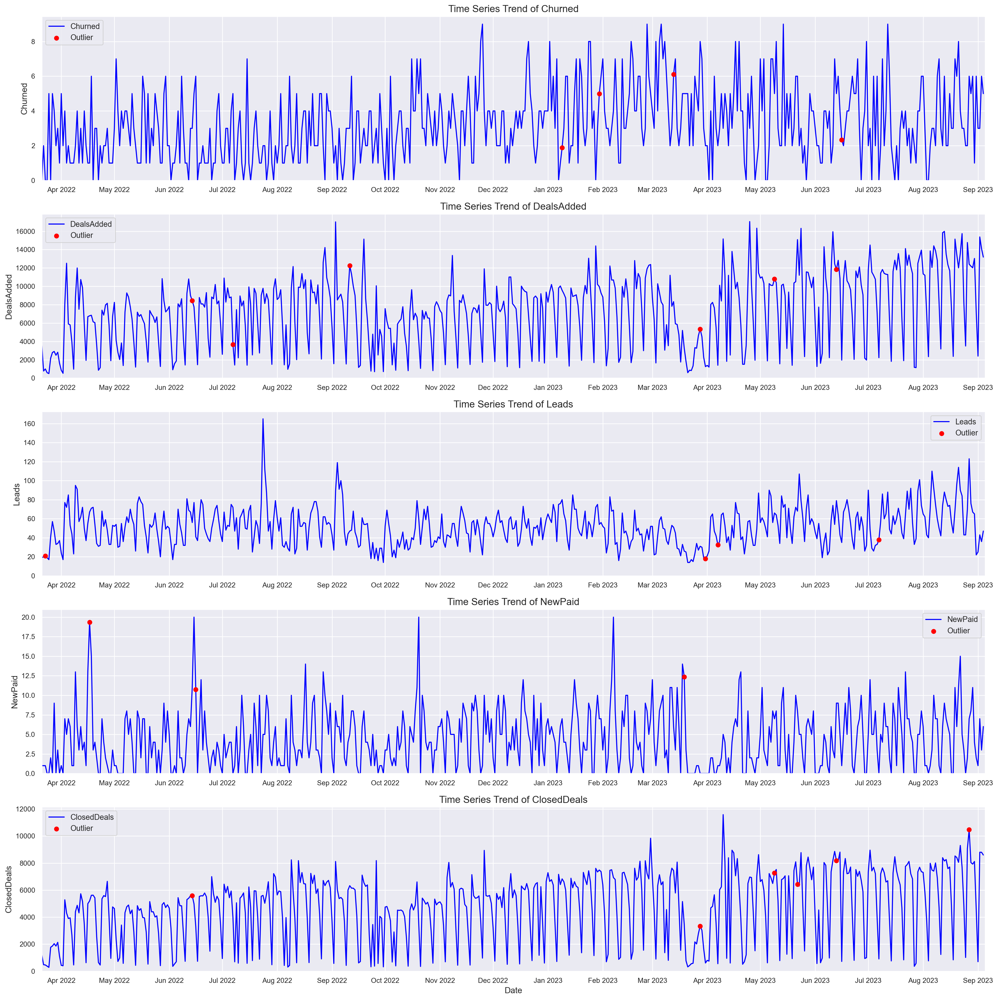

In [15]:
fig, axes = plt.subplots(len(features_to_detect_outliers), 1, figsize=(20, 4*len(features_to_detect_outliers)) , dpi=200)

# Loop through each column and plot its time series
for i, column in enumerate(features_to_detect_outliers):
    ax = axes[i]

    # Plot the entire time series
    ax.plot(df_without_outlier['Date'], df_without_outlier[column], label=column, color='blue')

    # Highlight the specified indices
    highlighted_values = df_without_outlier[column][outlier_indices_dic[column]]
    ax.scatter(df_without_outlier['Date'][outlier_indices_dic[column]], highlighted_values, color='red', label='Outlier', zorder=5)

    # Customize the subplot
    ax.set_ylabel(column)
    ax.set_title(f'Time Series Trend of {column}', fontsize=14)
    ax.tick_params(axis='both', labelsize=10)
    ax.set_xlim([start_date , end_date])
    ax.set_ylim(0)
    ax.legend()
    ax.xaxis.set_major_locator(MonthLocator(interval=1))
    ax.xaxis.set_major_formatter(DateFormatter('%b %Y'))  # Format the month and year

# Add a common x-axis label
axes[-1].set_xlabel('Date')

plt.tight_layout()
plt.show()

final dataframe before applying TS methods

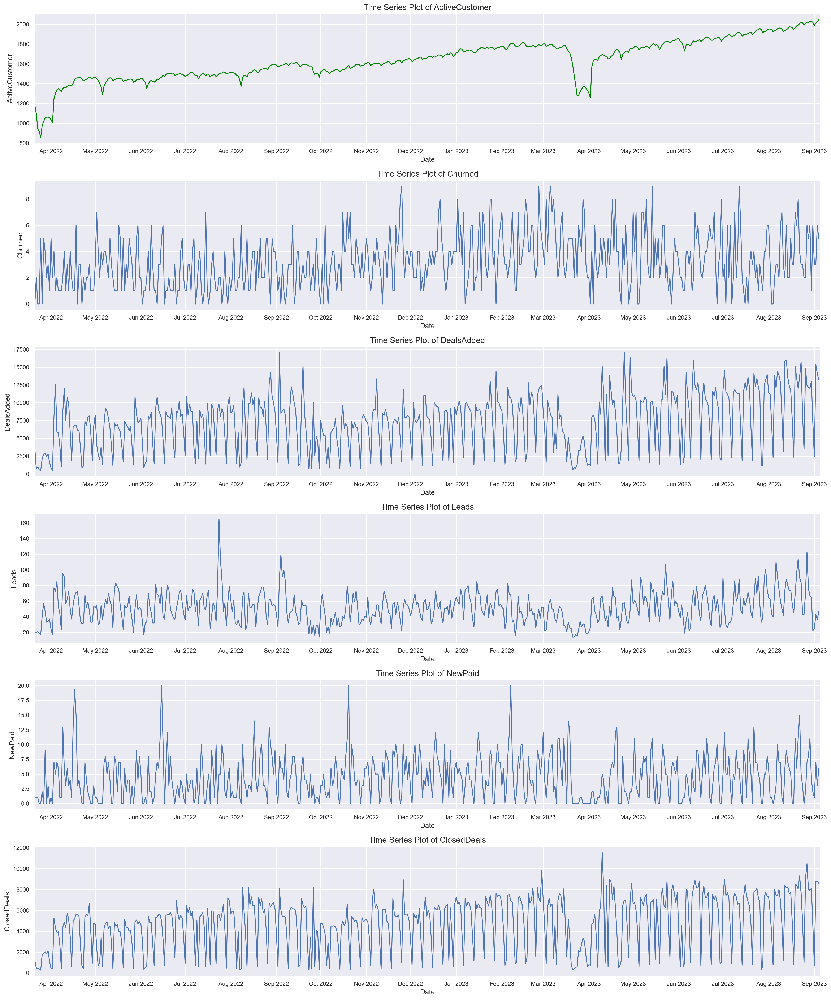

In [16]:
features = df_without_outlier.columns.drop('Date')

sns.set_theme()

# Create subplots for each feature
fig, axes = plt.subplots(len(features), 1, figsize=(20, 4*len(features)) , dpi=200)

# Iterate through each feature and plot it
for i, feature in enumerate(features):
    if feature == 'ActiveCustomer':
        # Set the color to red for the 'ActiveCustomer' feature
        sns.lineplot(data=df_without_outlier, x='Date', y=feature, ax=axes[i], color='green')
    else:
        sns.lineplot(data=df_without_outlier, x='Date', y=feature, ax=axes[i])
    axes[i].set_title(f'Time Series Plot of {feature}', fontsize=14)
    axes[i].set_xlabel('Date', fontsize=12)
    axes[i].set_ylabel(feature, fontsize=12)
    axes[i].tick_params(axis='both', labelsize=10)
    axes[i].set_xlim([start_date , end_date])
    # Set custom date locator for x-axis to show every month
    axes[i].xaxis.set_major_locator(MonthLocator(interval=1))
    axes[i].xaxis.set_major_formatter(DateFormatter('%b %Y'))  # Format the month and year
    
# Adjust subplot layout for better readability
plt.tight_layout()

# Show the plots
plt.show()

# Output

In [17]:
import os
path = '1. Preprocessing'
os.makedirs(path , exist_ok=True)
df_without_outlier.to_csv(path + '/Preprocessed_df.csv' , index=0)